# Day 1
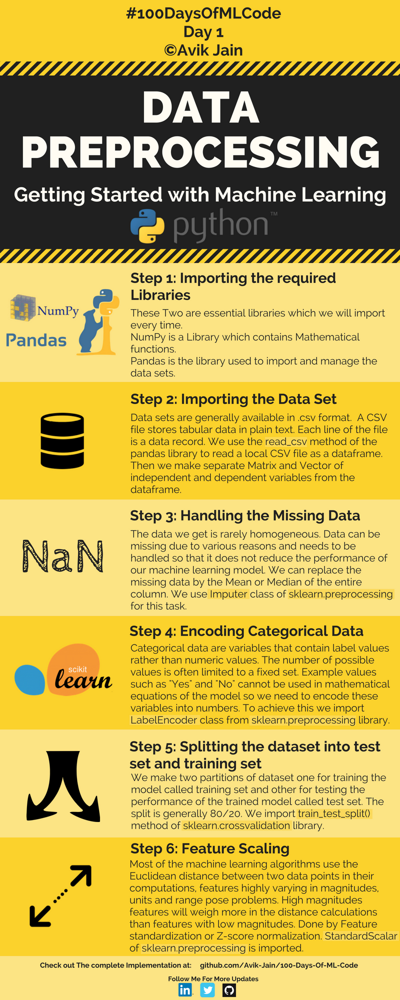

In [23]:
import numpy as np
import pandas as pd

In [24]:
df = pd.read_csv('Data_day1.csv')

In [25]:
df

,Country,Age,Salary,Purchased
0,France,44.0,72000.0,No
1,Spain,27.0,48000.0,Yes
2,Germany,30.0,54000.0,No
3,Spain,38.0,61000.0,No
4,Germany,40.0,NaN,Yes
5,France,35.0,58000.0,Yes
6,Spain,NaN,52000.0,No
7,France,48.0,79000.0,Yes
8,Germany,50.0,83000.0,No
9,France,37.0,67000.0,Yes


In [26]:
#handling the missing value
df.isnull().sum()

Country      0
Age          1
Salary       1
Purchased    0
dtype: int64

The word “impute” means a value assigned to something by inference from the value of the products or processes to which it contributes. In statistics, imputation is the process of replacing missing data with substituted values.

In [27]:
#null values age-1,salary-1
#one way, a very basic way to do so.
# df['Age'] = df['Age'].fillna(df['Age'].mean())
#df['Age'] = df['Age'].fillna(df['Age'].value_counts().index[0])
#sometimes you want to use something different like SimpleImputer from sklearn.impute
from sklearn.impute import SimpleImputer
simp = SimpleImputer(missing_values =np.nan,strategy = 'median')
simp = simp.fit(df[['Salary']])
df['Salary'] = simp.transform(df[['Salary']])
df['Age'] = df['Age'].fillna(df['Age'].value_counts().index[0])

#Take note that both the fit() and transform() 
#functions expect a 2D array, so be sure to pass in a 2D array or dataframe. If you pass in a 1D array or a Pandas Series, you will get an error.
#we can also do multiple fitting
#imputer = imputer.fit(df[['B','C']])
#df[['B','C']] = imputer.transform(df[['B','C']])
#df
#imputer = SimpleImputer(strategy = 'most_frequent',missing_vaLues = np.nan)

In [28]:
df

,Country,Age,Salary,Purchased
0,France,44.0,72000.0,No
1,Spain,27.0,48000.0,Yes
2,Germany,30.0,54000.0,No
3,Spain,38.0,61000.0,No
4,Germany,40.0,61000.0,Yes
5,France,35.0,58000.0,Yes
6,Spain,44.0,52000.0,No
7,France,48.0,79000.0,Yes
8,Germany,50.0,83000.0,No
9,France,37.0,67000.0,Yes


A categorical variable is one that has two or more categories (values). There are two types of categorical variable, nominal and ordinal. A nominal variable has no intrinsic ordering to its categories. For example, gender is a categorical variable having two categories (male and female) with no intrinsic ordering to the categories. An ordinal variable has a clear ordering.

1. One-Hot Encoding
Encoding each categorical variable with different Boolean variables (also called dummy variables) which take values 0 or 1, indicating if a category is present in an observation.
2. Integer Encoding / Label Encoding: Replace the categories by a number from 1 to n (or 0 to n-1, depending the implementation), where n is the number of distinct categories of the variable.

3. Count or frequency encoding: Replace the categories by the count of the observations that show that category in the dataset. Similarly, we can replace the category by the frequency -or percentage- of observations in the dataset. That is, if 10 of our 100 observations show the color blue, we would replace blue by 10 if doing count encoding, or by 0.1 if replacing by the frequency.

4. Ordered Integer Encoding: Categories are replaced by integer 1 to k, where k is the distinct categories in variable, but this numbering is decided by mean of target of each category. In example shown below,Green has target mean of 0, Red has target mean of 0.5, yellow has target mean of 1. Hence yellow is replaced by 1, Red by 2 and Green by 3.


5. Encoding using “Weight of Evidence”: Each category will be replaced by natural log of [p(1)/p(0)], where p(1) is the probability of good target variable and p(0) is the probability of bad target variable of each category in categorical variable. In famous “titanic” dataset, one of the categorical variables, “Cabin” can encoded as shown below, given that “Survived” as target variable. p(1) is the probability of surviving for each category and p(0) is the probability of death. Note: WoE is well suited for Logistic Regression, because the Logit transformation is simply the log of the odds, i.e., ln(P(Goods)/P(Bads)).



In [29]:
#encoding categorical data
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()
enc_df = pd.DataFrame(ohe.fit_transform(df[['Country']]).toarray(), columns =
                      ohe.get_feature_names_out(['Country']))


In [30]:
#second way for onehot encoding is using pd.get_dummies
#dum_df = pd.get_dummies(bridge_df, columns=["Bridge_Types"], prefix=["Type_is"] )
# merge with main df bridge_df on key values
#bridge_df = bridge_df.join(dum_df)
#bridge_df
enc_df_2 = pd.get_dummies(df,columns = ['Purchased'], prefix = ['Type_is'])
df = pd.concat([df,enc_df,enc_df_2],axis = 1)
df = df.drop(columns = ['Purchased'])
df = df.drop(columns = ['Country'])
df

,Age,Salary,Country_France,Country_Germany,Country_Spain,Age,Salary,Type_is_No,Type_is_Yes
0,44.0,72000.0,1.0,0.0,0.0,44.0,72000.0,1,0
1,27.0,48000.0,0.0,0.0,1.0,27.0,48000.0,0,1
2,30.0,54000.0,0.0,1.0,0.0,30.0,54000.0,1,0
3,38.0,61000.0,0.0,0.0,1.0,38.0,61000.0,1,0
4,40.0,61000.0,0.0,1.0,0.0,40.0,61000.0,0,1
5,35.0,58000.0,1.0,0.0,0.0,35.0,58000.0,0,1
6,44.0,52000.0,0.0,0.0,1.0,44.0,52000.0,1,0
7,48.0,79000.0,1.0,0.0,0.0,48.0,79000.0,0,1
8,50.0,83000.0,0.0,1.0,0.0,50.0,83000.0,1,0
9,37.0,67000.0,1.0,0.0,0.0,37.0,67000.0,0,1


In [31]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
MM = MinMaxScaler()
df['Salary']= MM.fit_transform(df['Salary'])

In [32]:
df

,Age,Salary,Country_France,Country_Germany,Country_Spain,Age,Salary,Type_is_No,Type_is_Yes
0,44.0,0.685714,1.0,0.0,0.0,44.0,0.685714,1,0
1,27.0,0.000000,0.0,0.0,1.0,27.0,0.000000,0,1
2,30.0,0.171429,0.0,1.0,0.0,30.0,0.171429,1,0
3,38.0,0.371429,0.0,0.0,1.0,38.0,0.371429,1,0
4,40.0,0.371429,0.0,1.0,0.0,40.0,0.371429,0,1
5,35.0,0.285714,1.0,0.0,0.0,35.0,0.285714,0,1
6,44.0,0.114286,0.0,0.0,1.0,44.0,0.114286,1,0
7,48.0,0.885714,1.0,0.0,0.0,48.0,0.885714,0,1
8,50.0,1.000000,0.0,1.0,0.0,50.0,1.000000,1,0
9,37.0,0.542857,1.0,0.0,0.0,37.0,0.542857,0,1


In [33]:
#label encoding
# Fit and transform the categorical column
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
#df['Country'] = le.fit_transform(df['Country'])
#train['FatContent'] = le.fit_transform(train['FatContent'])

In [34]:
from sklearn.model_selection import train_test_split
X = df.drop(columns = 'Salary')
y = df['Salary']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2, random_state =5)

In [35]:
X_train.reset_index(inplace= True)

In [36]:
X_train = X_train.drop(columns=[ 'index'])

In [37]:
X_train

,Age,Country_France,Country_Germany,Country_Spain,Age,Type_is_No,Type_is_Yes
0,30.0,0.0,1.0,0.0,30.0,1,0
1,40.0,0.0,1.0,0.0,40.0,0,1
2,48.0,1.0,0.0,0.0,48.0,0,1
3,27.0,0.0,0.0,1.0,27.0,0,1
4,44.0,1.0,0.0,0.0,44.0,1,0
5,50.0,0.0,1.0,0.0,50.0,1,0
6,44.0,0.0,0.0,1.0,44.0,1,0
7,38.0,0.0,0.0,1.0,38.0,1,0


In [ ]:
# df['Gender'].value_counts().plot(kind='bar')
# Select the first row
#print(df.iloc[0])
## Select the column name 'Gender'
#print(df.loc[:,'Gender'])
#Pandas’ .assign() function is used to add new columns to a DataFrame, based on the computation of existing columns.
#It allows you to add new columns to a DataFrame without modifying the original dataframe. 
#The function returns a new DataFrame with the added columns.
#df_new = df.assign(count_plus_5=df['Count'] + 5)
# Select rows where age is greater than 30 and income is less than 65000
#df_query = df.query('Count > 30 and Rank < 20')
#df_query.head()
# Sort by age in ascending order
#df_sorted = df.sort_values(by='Count')
#df_sorted.head()
# Sample 2 rows without replacement
#df_sample = df.sample(n=2, replace=False, random_state=1)
#df_sample
 #A pivot table is a table that summarizes and aggregates data in a more meaningful and organized way, 
#by creating a new table with one or more columns as the index, one or more columns as values, and one
#or more columns as attributes.
#A pandas pivot table has three main elements:
#Index: This specifies the row-level grouping.
#Column: This specifies the column level grouping. 
#Values: These are the numerical values you are looking to summarize.
# pivot_table = pd.pivot_table(df, index='Ethnicity', values='Count', aggfunc='sum')
# pivot_table.head()
# Rename column 'Count' to 'count'
#df_rename = df.rename(columns={'Count': 'count'})
#df_rename.head()

# Day2
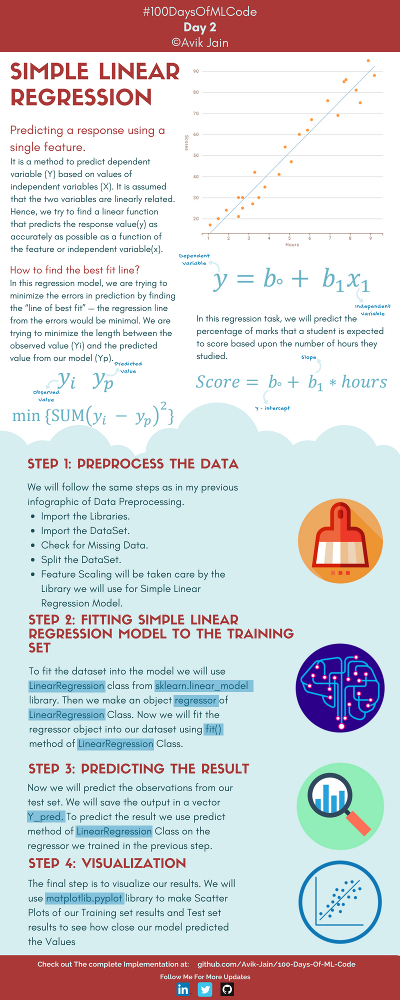

In [39]:
from sklearn.linear_model import LinearRegression

In [40]:
lr = LinearRegression()

In [41]:
lr.fit(X_train,y_train)

LinearRegression()

In [42]:
y_pred = lr.predict(X_test)

plt.scatter(X_train, y_train, color = 'blue')
plt.plot(X_train, regressor.predict(X_train), color = 'red')
plt.title('Salary vs Experience (Training set)')
plt.xlabel('Years of Experience')
plt.ylabel('Salary')
plt.show()

In [52]:
#now for some self effort I will read in details about topics of day 2 from blogs
https://becominghuman.ai/data-science-the-smart-way-regression-600bb49a391e


SyntaxError: invalid syntax (38459403.py, line 2)

# Day 3
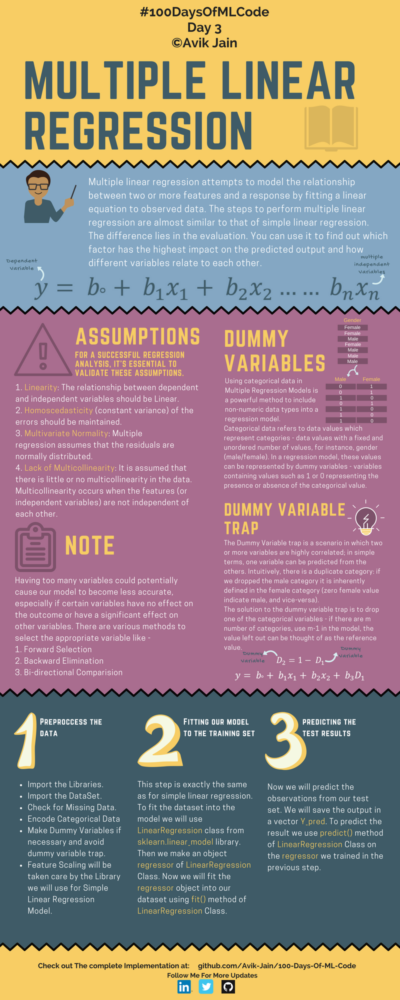

In [66]:
df_2 = pd.read_csv('Data_day_3.csv')  # info on startups

In [67]:
df_2

,R&D Spend,Administration,Marketing Spend,State,Profit
0,165349.20,136897.80,471784.10,New York,192261.83
1,162597.70,151377.59,443898.53,California,191792.06
2,153441.51,101145.55,407934.54,Florida,191050.39
3,144372.41,118671.85,383199.62,New York,182901.99
4,142107.34,91391.77,366168.42,Florida,166187.94
5,131876.90,99814.71,362861.36,New York,156991.12
6,134615.46,147198.87,127716.82,California,156122.51
7,130298.13,145530.06,323876.68,Florida,155752.60
8,120542.52,148718.95,311613.29,New York,152211.77
9,123334.88,108679.17,304981.62,California,149759.96


### encoding the state
### Scaling

In [68]:
df_2.isnull().sum()

R&D Spend          0
Administration     0
Marketing Spend    0
State              0
Profit             0
dtype: int64

In [69]:
#onehotencoding the state
from sklearn.preprocessing import OneHotEncoder

In [70]:
ohe = OneHotEncoder()
enc_df = pd.DataFrame(ohe.fit_transform(df_2[['State']]).toarray(),columns =
                                        ohe.get_feature_names_out(['State']))

In [72]:
df_2=pd.concat([df_2,enc_df],axis =1)


In [73]:
df_2 = df_2.drop(columns=['State'])

In [74]:
df_2

,R&D Spend,Administration,Marketing Spend,Profit,State_California,State_Florida,State_New York
0,165349.20,136897.80,471784.10,192261.83,0.0,0.0,1.0
1,162597.70,151377.59,443898.53,191792.06,1.0,0.0,0.0
2,153441.51,101145.55,407934.54,191050.39,0.0,1.0,0.0
3,144372.41,118671.85,383199.62,182901.99,0.0,0.0,1.0
4,142107.34,91391.77,366168.42,166187.94,0.0,1.0,0.0
5,131876.90,99814.71,362861.36,156991.12,0.0,0.0,1.0
6,134615.46,147198.87,127716.82,156122.51,1.0,0.0,0.0
7,130298.13,145530.06,323876.68,155752.60,0.0,1.0,0.0
8,120542.52,148718.95,311613.29,152211.77,0.0,0.0,1.0
9,123334.88,108679.17,304981.62,149759.96,1.0,0.0,0.0


In [77]:
from sklearn.linear_model import LinearRegression
X2 = df_2.drop(columns = ['Profit'])
y2 = df_2['Profit']

In [80]:
lr2 = LinearRegression()
X_t2,X_te2,y_t2,y_te2 = train_test_split(X2,y2,test_size = 0.2, random_state = 5)

In [81]:
lr2.fit(X_t2,y_t2)

LinearRegression()

In [82]:
y_t_pred = lr2.predict(X_t2)
y_te_pred = lr2.predict(X_te2)

In regression model, the most commonly known evaluation metrics include:

R-squared (R2), which is the proportion of variation in the outcome that is explained by the predictor variables. In multiple regression models, R2 corresponds to the squared correlation between the observed outcome values and the predicted values by the model. The Higher the R-squared, the better the model.

Root Mean Squared Error (RMSE), which measures the average error performed by the model in predicting the outcome for an observation. Mathematically, the RMSE is the square root of the mean squared error (MSE), which is the average squared difference between the observed actual outome values and the values predicted by the model. So, MSE = mean((observeds - predicteds)^2) and RMSE = sqrt(MSE). The lower the RMSE, the better the model.

Residual Standard Error (RSE), also known as the model sigma, is a variant of the RMSE adjusted for the number of predictors in the model. The lower the RSE, the better the model. In practice, the difference between RMSE and RSE is very small, particularly for large multivariate data.

Mean Absolute Error (MAE), like the RMSE, the MAE measures the prediction error. Mathematically, it is the average absolute difference between observed and predicted outcomes, MAE = mean(abs(observeds - predicteds)). MAE is less sensitive to outliers compared to RMSE.
https://www.analyticsvidhya.com/blog/2021/05/multiple-linear-regression-using-python-and-scikit-learn/
https://towardsdatascience.com/a-comprehensive-overview-of-regression-evaluation-metrics-6264af0926db



In [86]:
from sklearn.metrics import r2_score, mean_squared_error
score_train = r2_score(y_t2,y_t_pred)
score_test = r2_score(y_te2,y_te_pred)
print('r2 socre for training data is' ,score_train)
print('r2 socre for test data is' ,score_test)

print('mean_sqrd_error for train set is==',mean_squared_error(y_t2,y_t_pred))
print('root_mean_squared error for train set is==',np.sqrt(mean_squared_error(y_t2,y_t_pred)))

print('mean_sqrd_error for test set is==',mean_squared_error(y_te2,y_te_pred))
print('root_mean_squared error for test set is==',np.sqrt(mean_squared_error(y_te2,y_te_pred)))

r2 socre for training data is 0.943850522642993
r2 socre for test data is 0.9669763022156826
mean_sqrd_error for train set is== 87224800.80266014
root_mean_squared error for train set is== 9339.421866617877
mean_sqrd_error for test set is== 52228531.74334526
root_mean_squared error for test set is== 7226.931004468305


# Day 4
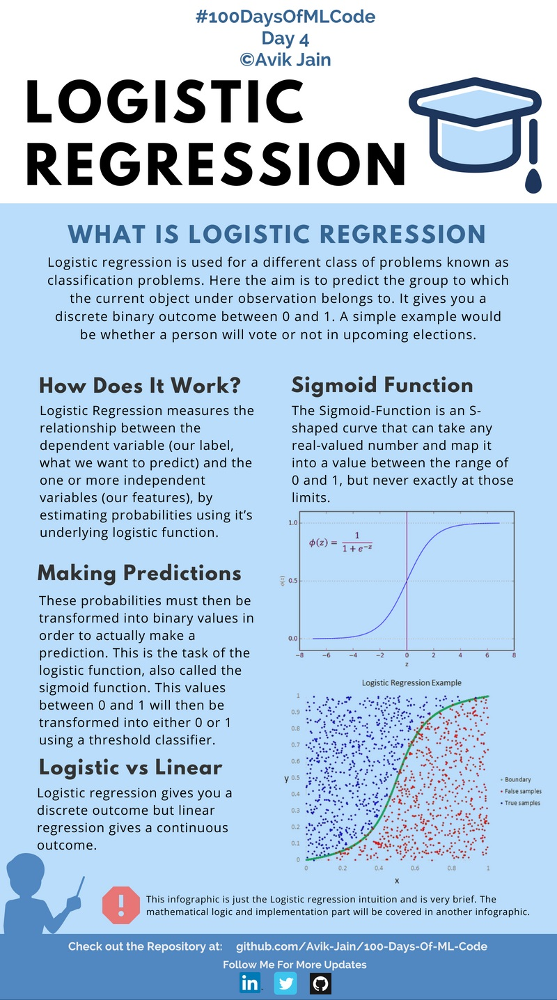

In [101]:
df_3 = pd.read_csv('Data_day_4.csv')

In [102]:
df_3

,User ID,Gender,Age,EstimatedSalary,Purchased
0,15624510,Male,19,19000,0
1,15810944,Male,35,20000,0
2,15668575,Female,26,43000,0
3,15603246,Female,27,57000,0
4,15804002,Male,19,76000,0
...,...,...,...,...,...
395,15691863,Female,46,41000,1
396,15706071,Male,51,23000,1
397,15654296,Female,50,20000,1
398,15755018,Male,36,33000,0


In [103]:
#userid doesn't matter in predicting
df_3n = df_3.drop(columns = ['User ID'])
df_3n.columns

Index(['Gender', 'Age', 'EstimatedSalary', 'Purchased'], dtype='object')

In [104]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder()
enc_df = pd.DataFrame(ohe.fit_transform(df_3n[['Gender']]).toarray(),columns =ohe.get_feature_names_out(['Gender']))
df_3n = df_3n.drop(columns = ['Gender'])


pandas.core.frame.DataFrame

In [105]:
df_3n= pd.concat([df_3n,enc_df],axis =1)

In [107]:
X_3  = df_3n.drop(columns = ['Purchased'])
y_3  = df_3n['Purchased']

In [109]:
X_t,X_te,y_t,y_te  = train_test_split(X_3,y_3,test_size = 0.2, random_state  = 5)

In [110]:
from sklearn.linear_model import LogisticRegression

In [112]:
lr = LogisticRegression()
lr.fit(X_t,y_t)

LogisticRegression()

In [113]:
y_te_pred = lr.predict(X_te)

In [114]:
y_t_pred = lr.predict(X_t)

In [118]:
from sklearn.metrics import confusion_matrix,precision_score
print(confusion_matrix(y_t,y_t_pred, labels = [0,1]),'\n',confusion_matrix(y_te,y_te_pred, labels = [0,1]))

[[204   0]
 [116   0]] 
 [[53  0]
 [27  0]]


# Day5
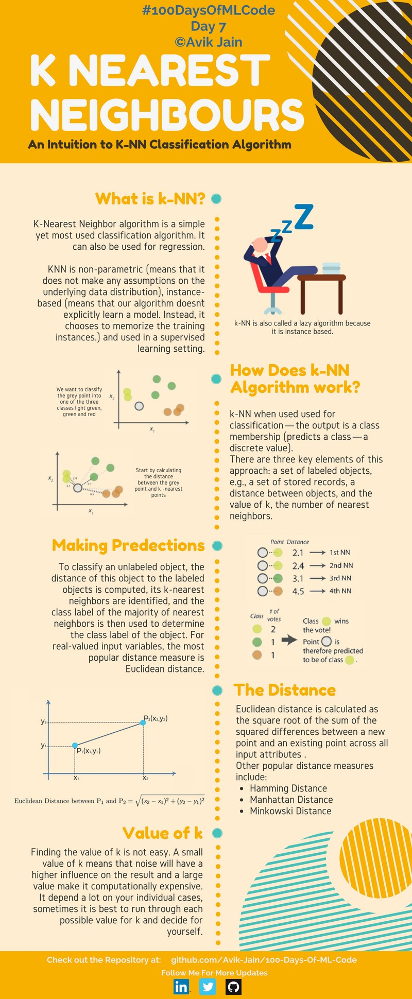

In [38]:
#implementing knn method
from sklearn.datasets import load_iris

In [39]:
iris = load_iris()
type(iris)

sklearn.utils._bunch.Bunch

In [40]:
iris.data

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

In [41]:
iris.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [42]:
iris.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [43]:
iris.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [44]:
iris_X = pd.DataFrame(iris.data,columns  = iris.feature_names)
iris_y = pd.DataFrame(iris.target)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [45]:
iris_y=iris_y.rename(columns={0:'flower_type'})

[[ 8  0  0]
 [ 0  9  2]
 [ 0  0 11]]
0.9487179487179488


In [47]:
from sklearn.model_selection import train_test_split


In [48]:
X_train,X_test,y_train,y_test = train_test_split(iris_X,iris_y,test_size = 0.2, random_state =5)

In [49]:
from sklearn.neighbors import KNeighborsClassifier,KNeighborsRegressor
knn = KNeighborsClassifier(n_neighbors=5)
y_t_v = y_train.values
y_train = y_t_v.ravel()
knn.fit(X_train, y_train)
#Predict the response for test dataset
print("Response for test dataset:")
y_pred = knn.predict(X_test)
print(y_pred.shape,y_test.shape)

Response for test dataset:
(30,) (30, 1)


In [16]:
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score
print(confusion_matrix(y_test,y_pred, labels = [0,1,2]))
print(precision_score(y_test,y_pred,average= 'macro'))

TypeError: '<' not supported between instances of 'int' and 'str'

# Day 6
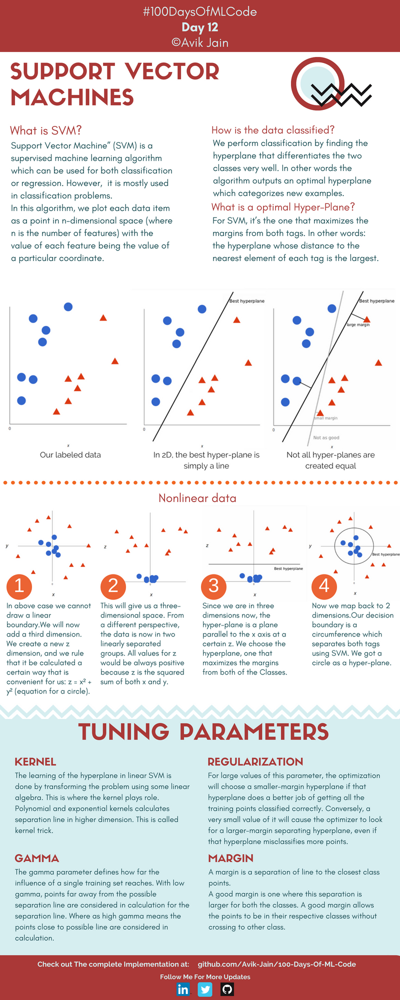

What is Support Vector Machine?
The objective of the support vector machine algorithm is to find a hyperplane in an N-dimensional space(N — the number of features) that distinctly classifies the data points.

https://www.analyticsvidhya.com/blog/2017/09/understaing-support-vector-machine-example-code/

In [5]:
df_4 = pd.read_csv('Iris.csv')


<IPython.core.display.Javascript object>

In [6]:
from sklearn import svm, datasets

In [7]:
df_4

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,Iris-setosa
1,2,4.9,3.0,1.4,0.2,Iris-setosa
2,3,4.7,3.2,1.3,0.2,Iris-setosa
3,4,4.6,3.1,1.5,0.2,Iris-setosa
4,5,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...,...
145,146,6.7,3.0,5.2,2.3,Iris-virginica
146,147,6.3,2.5,5.0,1.9,Iris-virginica
147,148,6.5,3.0,5.2,2.0,Iris-virginica
148,149,6.2,3.4,5.4,2.3,Iris-virginica


In [8]:
df_4.drop(columns=['Id'])

,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,Iris-virginica
146,6.3,2.5,5.0,1.9,Iris-virginica
147,6.5,3.0,5.2,2.0,Iris-virginica
148,6.2,3.4,5.4,2.3,Iris-virginica


In [9]:
X = df_4.drop(columns = ['Species'])
y = df_4['Species']

In [10]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size= 0.3 ,random_state = 5)

<IPython.core.display.Javascript object>

In [11]:
c =1
svc  =svm.SVC(kernel = 'poly',C=1)


In [12]:
svc.fit(X_train,y_train)

SVC(C=1, kernel='poly')

In [13]:
y_pred = svc.predict(X_test)

In [18]:
from sklearn.metrics import precision_recall_fscore_support
print(precision_score(y_test,y_pred,average= 'macro'))

0.9444444444444445


In [19]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,y_pred)

array([[15,  0,  0],
       [ 3, 13,  0],
       [ 0,  0, 14]], dtype=int64)

In [20]:
df_4

,Id,SepalLengthCm,SepalWidthCm,PetalLengthCm,PetalWidthCm,Species
0,1,5.1,3.5,1.4,0.2,Iris-setosa
1,2,4.9,3.0,1.4,0.2,Iris-setosa
2,3,4.7,3.2,1.3,0.2,Iris-setosa
3,4,4.6,3.1,1.5,0.2,Iris-setosa
4,5,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...,...
145,146,6.7,3.0,5.2,2.3,Iris-virginica
146,147,6.3,2.5,5.0,1.9,Iris-virginica
147,148,6.5,3.0,5.2,2.0,Iris-virginica
148,149,6.2,3.4,5.4,2.3,Iris-virginica


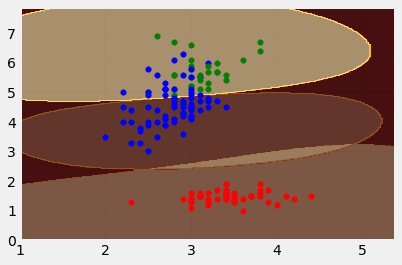

In [21]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
from matplotlib import style
from sklearn.svm import SVC 
  
style.use('fivethirtyeight')
  
# create mesh grids
def make_meshgrid(x, y, h =.02):
    x_min, x_max = x.min() - 1, x.max() + 1
    y_min, y_max = y.min() - 1, y.max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    return xx, yy
  
# plot the contours
def plot_contours(ax, clf, xx, yy, **params):
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    out = ax.contourf(xx, yy, Z, **params)
    return out
  
color = ['r', 'b', 'g', 'k']
  
iris = pd.read_csv("Iris.csv").values
  
  
features = iris[0:150, 2:4]
level1 = np.zeros(150)
level2 = np.zeros(150)
level3 = np.zeros(150)
  
# level1 contains 1 for class1 and 0 for all others.
# level2 contains 1 for class2 and 0 for all others.
# level3 contains 1 for class3 and 0 for all others.
for i in range(150):
    if i>= 0 and i<50:
        level1[i] = 1
    elif i>= 50 and i<100:
        level2[i] = 1
    elif i>= 100 and i<150:
        level3[i]= 1
  
# create 3 svm with rbf kernels
svm1 = SVC(kernel ='rbf')
svm2 = SVC(kernel ='rbf')
svm3 = SVC(kernel ='rbf')
  
# fit each svm's
svm1.fit(features, level1)
svm2.fit(features, level2)
svm3.fit(features, level3)
  
fig, ax = plt.subplots()
X0, X1 = iris[:, 2], iris[:, 3]
xx, yy = make_meshgrid(X0, X1)
  
# plot the contours
plot_contours(ax, svm1, xx, yy, cmap = plt.get_cmap('hot'), alpha = 0.8)
plot_contours(ax, svm2, xx, yy, cmap = plt.get_cmap('hot'), alpha = 0.3)
plot_contours(ax, svm3, xx, yy, cmap = plt.get_cmap('hot'), alpha = 0.5)
  
color = ['r', 'b', 'g', 'k']
  
for i in range(len(iris)):
    plt.scatter(iris[i][2], iris[i][3], s = 30, c = color[int(iris[i][4])])
plt.show()

In [22]:
#from matplotlib.colors import ListedColormap
#X_set, y_set = X_train, y_train
#X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 0.01),
#                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 0.01))
#plt.contourf(X1, X2, classifier.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),
#             alpha = 0.75, cmap = ListedColormap(('red', 'green')))
#plt.xlim(X1.min(), X1.max())
#plt.ylim(X2.min(), X2.max())
#for i, j in enumerate(np.unique(y_set)):
#    plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
#                c = ListedColormap(('red', 'green'))(i), label = j)
#plt.title('SVM (Training set)')
#plt.xlabel('Age')
#plt.ylabel('Estimated Salary')
#plt.legend()
#plt.show()

# Day 7:  Naive Bias classifier
It is a classification technique based on Bayes’ Theorem with an independence assumption among predictors. In simple terms, a Naive Bayes classifier assumes that the presence of a particular feature in a class is unrelated to the presence of any other feature.
 it is worth noting that naive Bayes classifiers are among the simplest Bayesian network models, yet they can achieve high accuracy levels when coupled with kernel density estimation. This technique involves using a kernel function to estimate the probability density function of the input data, allowing the classifier to improve its performance in complex scenarios where the data distribution is not well-defined. As a result, the naive Bayes classifier is a powerful tool in machine learning, particularly in text classification, spam filtering, and sentiment analysis, among others.
 
 Real-time Prediction: Naive Bayesian classifier is an eager learning classifier and it is super fast. Thus, it could be used for making predictions in real time.
 
Multi-class Prediction: This algorithm is also well known for multi class prediction feature. Here we can predict the probability of multiple classes of target variable.

Text classification/ Spam Filtering/ Sentiment Analysis: Naive Bayesian classifiers mostly used in text classification (due to better result in multi class problems and independence rule) have higher success rate as compared to other algorithms. As a result, it is widely used in Spam filtering (identify spam e-mail) and Sentiment Analysis (in social media analysis, to identify positive and negative customer sentiments)

Recommendation System: Naive Bayes Classifier and Collaborative Filtering together builds a Recommendation System that uses machine learning and data mining techniques to filter unseen information and predict whether a user would like a given resource or not.

Here are some tips for improving power of Naive Bayes Model:

If continuous features do not have normal distribution, we should use transformation or different methods to convert it in normal distribution.
If test data set has zero frequency issue, apply smoothing techniques “Laplace Correction” to predict the class of test data set.
Remove correlated features, as the highly correlated features are voted twice in the model and it can lead to over inflating importance.
Naive Bayes classifiers has limited options for parameter tuning like alpha=1 for smoothing, fit_prior=[True|False] to learn class prior probabilities or not and some other options (look at detail here). I would recommend to focus on your  pre-processing of data and the feature selection.
You might think to apply some classifier combination technique like ensembling, bagging and boosting but these methods would not help. Actually, “ensembling, boosting, bagging” won’t help since their purpose is to reduce variance. Naive Bayes has no variance to minimize.
BernoulliNB
Naive Bayes classifier for multivariate Bernoulli models.

CategoricalNB
Naive Bayes classifier for categorical features.

ComplementNB
Complement Naive Bayes classifier.

GaussianNB
Gaussian Naive Bayes.

MultinomailNB
The multinomial Naive Bayes classifier is suitable for classification with discrete features (e.g., word counts for text classification). The multinomial distribution normally requires integer feature counts. However, in practice, fractional counts such as tf-idf may also work.

https://scikit-learn.org/stable/modules/naive_bayes.html#multinomial-naive-bayes

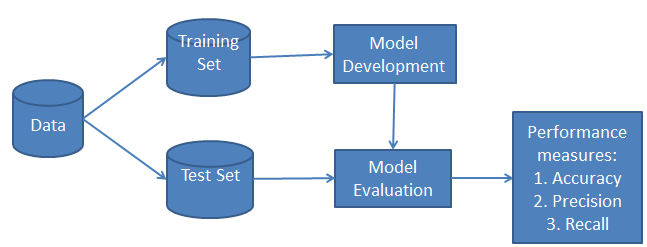

In [133]:
from sklearn.datasets import make_classification

X, y = make_classification(
    n_features=6,
    n_classes=3,
    n_samples=800,
    n_informative=2,
    random_state=1,
    n_clusters_per_class=1,
)

In [139]:
X.shape,y.shape

((800, 6), (800,))

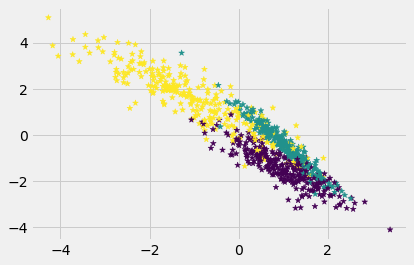

In [140]:
import matplotlib.pyplot as plt

plt.scatter(X[:, 0], X[:, 1], c=y, marker="*");

In [142]:
X_train, X_test,y_train,y_test = train_test_split(X,y,test_size = 0.3, random_state = 10)

In [144]:
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(X_train,y_train)


GaussianNB()

In [145]:
# Predict Output
predicted = model.predict(X_test)

print("Actual Value:", y_test)
print("Predicted Value:", predicted)

Actual Value: [0 0 0 1 1 0 2 0 2 2 2 1 0 1 0 1 0 0 2 0 2 2 0 0 1 1 2 0 0 2 0 1 0 0 0 0 2
 1 1 0 1 2 1 0 1 0 2 2 1 2 2 0 2 1 1 2 0 1 2 2 1 2 1 2 1 1 1 2 2 0 0 0 1 2
 1 1 2 1 1 2 0 1 1 1 1 2 0 1 2 1 2 2 2 0 2 0 1 0 2 1 0 2 1 0 0 0 2 2 0 0 2
 1 1 2 2 2 2 2 2 1 1 1 2 1 2 0 0 1 0 1 0 2 2 2 0 2 2 0 1 1 2 0 0 1 1 1 0 1
 1 2 2 2 1 1 0 2 1 1 1 1 1 0 0 2 1 0 2 1 0 2 0 2 2 1 1 0 1 1 2 0 1 1 1 2 0
 2 0 2 0 1 2 0 1 0 1 0 0 1 0 0 2 2 0 0 2 0 1 0 0 1 0 2 2 2 1 0 0 2 0 2 1 2
 1 1 1 2 2 2 2 2 2 1 0 1 0 2 0 0 0 1]
Predicted Value: [1 0 0 1 1 0 2 0 2 2 0 1 0 1 0 1 0 0 2 0 2 1 0 0 1 1 2 0 0 2 0 1 0 0 0 0 2
 1 1 0 1 2 0 0 1 0 2 2 1 2 2 0 2 1 1 2 0 1 1 2 1 2 1 2 2 1 1 1 2 0 0 0 1 2
 1 1 2 1 2 2 0 1 1 1 1 2 0 1 2 1 2 2 1 0 0 0 1 0 2 1 0 2 1 0 0 0 2 2 1 0 2
 1 1 2 0 2 2 2 2 1 1 1 2 1 2 0 0 1 1 0 1 2 2 2 0 2 2 0 1 1 2 1 0 1 1 1 2 1
 1 2 2 2 1 1 0 2 1 1 1 1 1 0 0 2 1 0 2 1 0 2 0 2 2 1 1 1 1 1 2 0 1 0 1 0 0
 2 0 1 0 1 2 0 1 0 1 0 0 1 0 0 2 2 0 0 2 0 1 0 0 1 0 1 2 2 1 0 0 2 0 2 1 2
 1 1 1 2 2 1 1 2 1 0 0 1 0 2 0 

In [147]:
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    ConfusionMatrixDisplay,
    f1_score,
)

accuray = accuracy_score(predicted, y_test)
f1 = f1_score(predicted, y_test, average="weighted")

print("Accuracy:", accuray)
print("F1 Score:", f1)
confusion_matrix(y_test,predicted )

Accuracy: 0.8916666666666667
F1 Score: 0.8913579729578723


array([[71,  6,  1],
       [ 4, 75,  2],
       [ 4,  9, 68]], dtype=int64)

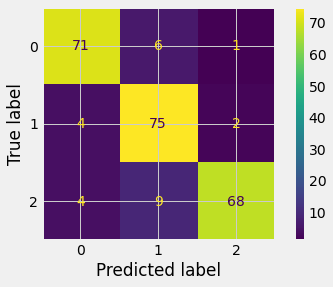

In [148]:
labels = [0,1,2]
cm = confusion_matrix(y_test, predicted, labels=labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
disp.plot();

# Day 8:  Decision tree, Random forest and Gradient boost

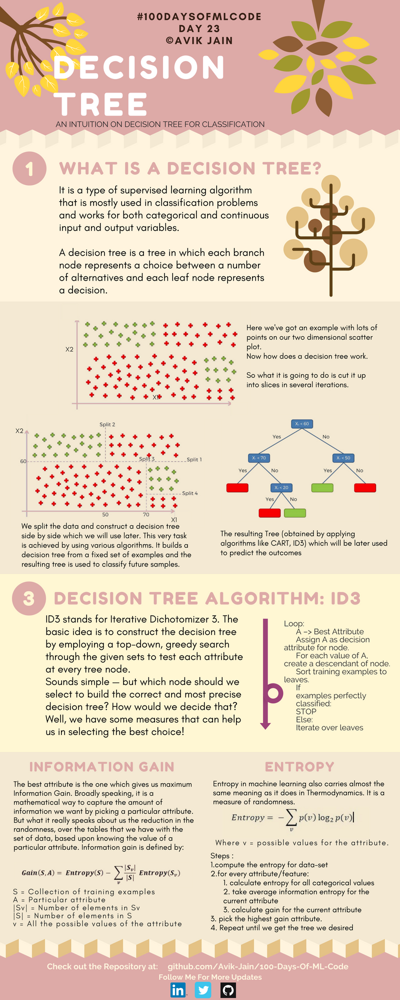

Gini
Gini  says, if we select two items from a population at random then they must be of same class and probability for this is 1 if population is pure.

It works with categorical target variable “Success” or “Failure”.
It performs only Binary splits
Higher the value of Gini higher the homogeneity.
CART (Classification and Regression Tree) uses Gini method to create binary splits.
Steps to Calculate Gini for a split

Calculate Gini for sub-nodes, using formula sum of square of probability for success and failure (p^2+q^2).
Calculate Gini for split using weighted Gini score of each node of that split
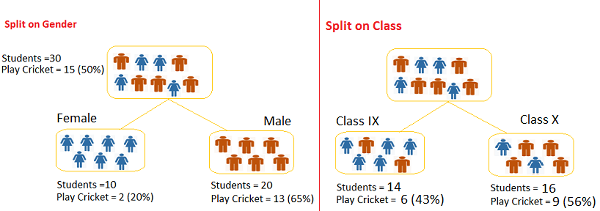
Split on Gender:

Calculate, Gini for sub-node Female = (0.2)*(0.2)+(0.8)*(0.8)=0.68
Gini for sub-node Male = (0.65)*(0.65)+(0.35)*(0.35)=0.55
Calculate weighted Gini for Split Gender = (10/30)*0.68+(20/30)*0.55 = 0.59
Similar for Split on Class:

Gini for sub-node Class IX = (0.43)*(0.43)+(0.57)*(0.57)=0.51
Gini for sub-node Class X = (0.56)*(0.56)+(0.44)*(0.44)=0.51
Calculate weighted Gini for Split Class = (14/30)*0.51+(16/30)*0.51 = 0.51
Above, you can see that Gini score for Split on Gender is higher than Split on Class, hence, the node split will take place on Gender.

Chi-Square:
We measure it by sum of squares of standardized differences between observed and expected frequencies of target variable.

Calculate Chi-square of node for “Play Cricket” and “Not Play Cricket” using formula with formula, = ((Actual – Expected)^2 / Expected)^1/2. You can refer below table for calculation.
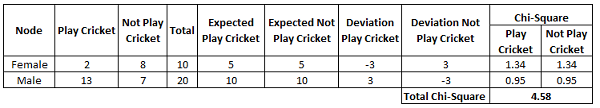
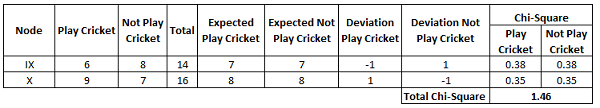

Information Gain:

Calculate entropy of parent node
Calculate entropy of each individual node of split and calculate weighted average of all sub-nodes available in split.

Let’s use this method to identify best split for student example.

Entropy for parent node = -(15/30) log2 (15/30) – (15/30) log2 (15/30) = 1. Here 1 shows that it is a impure node.

Entropy for Female node = -(2/10) log2 (2/10) – (8/10) log2 (8/10) = 0.72 and for male node,  -(13/20) log2 (13/20) – (7/20) log2 (7/20) = 0.93

Entropy for split Gender = Weighted entropy of sub-nodes = (10/30)*0.72 + (20/30)*0.93 = 0.86
Entropy for Class IX node, -(6/14) log2 (6/14) – (8/14) log2 (8/14) = 0.99 and for Class X node,  -(9/16) log2 (9/16) – (7/16) log2 (7/16) = 0.99.
Entropy for split Class =  (14/30)*0.99 + (16/30)*0.99 = 0.99

We can derive information gain from entropy as 1- Entropy.

Reduction in Variance
Till now, we have discussed the algorithms for categorical target variable. Reduction in variance is an algorithm used for continuous target variables (regression problems). This algorithm uses the standard formula of variance to choose the best split. The split with lower variance is selected as the criteria to split the population:
Let’s assign numerical value 1 for play cricket and 0 for not playing cricket. Now follow the steps to identify the right split:

Variance for Root node, here mean value is (15*1 + 15*0)/30 = 0.5 and we have 15 one and 15 zero. Now variance would be ((1-0.5)^2+(1-0.5)^2+….15 times+(0-0.5)^2+(0-0.5)^2+…15 times) / 30, this can be written as (15*(1-0.5)^2+15*(0-0.5)^2) / 30 = 0.25
Mean of Female node =  (2*1+8*0)/10=0.2 and Variance = (2*(1-0.2)^2+8*(0-0.2)^2) / 10 = 0.16
Mean of Male Node = (13*1+7*0)/20=0.65 and Variance = (13*(1-0.65)^2+7*(0-0.65)^2) / 20 = 0.23
Variance for Split Gender = Weighted Variance of Sub-nodes = (10/30)*0.16 + (20/30) *0.23 = 0.21
Mean of Class IX node =  (6*1+8*0)/14=0.43 and Variance = (6*(1-0.43)^2+8*(0-0.43)^2) / 14= 0.24
Mean of Class X node =  (9*1+7*0)/16=0.56 and Variance = (9*(1-0.56)^2+7*(0-0.56)^2) / 16 = 0.25
Variance for Split Gender = (14/30)*0.24 + (16/30) *0.25 = 0.25

preventing overfitting is pivotal while modeling a decision tree and it can be done in 2 ways:

Setting constraints on tree size
Tree pruning
https://www.analyticsvidhya.com/blog/2016/04/tree-based-algorithms-complete-tutorial-scratch-in-python/
The algorithm selection is also based on the type of target variables. Let us look at some algorithms used in Decision Trees:

ID3 → (extension of D3)
C4.5 → (successor of ID3)
CART → (Classification And Regression Tree)
CHAID → (Chi-square automatic interaction detection Performs multi-level splits when computing classification trees)
MARS → (multivariate adaptive regression splines)

class sklearn.tree.DecisionTreeClassifier(*, criterion='gini', splitter='best', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features=None, random_state=None, max_leaf_nodes=None, min_impurity_decrease=0.0, class_weight=None, ccp_alpha=0.0)[source]¶

In [27]:
from sklearn import tree
#Assumed you have, X (predictor) and Y (target) for training data set and x_test(predictor) of test_dataset
# Create tree object 
model2 = tree.DecisionTreeClassifier(criterion='gini') # for classification, here you can change the algorithm as gini or entropy (information gain) by default it is gini  

# https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html#sklearn.tree.DecisionTreeClassifier

# model = tree.DecisionTreeRegressor() for regression
# Train the model using the training sets and check score
model2.fit(X_train, y_train)
model2.score(X_train, y_train)
#Predict Output
predicted= model.predict(X_test)

[Text(0.6, 0.8333333333333334, 'x[0] <= 100.5\ngini = 0.666\nsamples = 105\nvalue = [35, 34, 36]'),
 Text(0.4, 0.5, 'x[4] <= 0.7\ngini = 0.5\nsamples = 69\nvalue = [35, 34, 0]'),
 Text(0.2, 0.16666666666666666, 'gini = 0.0\nsamples = 35\nvalue = [35, 0, 0]'),
 Text(0.6, 0.16666666666666666, 'gini = 0.0\nsamples = 34\nvalue = [0, 34, 0]'),
 Text(0.8, 0.5, 'gini = 0.0\nsamples = 36\nvalue = [0, 0, 36]')]

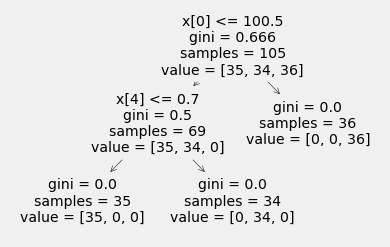

In [29]:
tree.plot_tree(model2)

In [33]:
import graphviz

In [35]:
from sklearn.datasets import load_iris
from sklearn import tree
iris = load_iris()
X, y = iris.data, iris.target
clf = tree.DecisionTreeClassifier()
clf = clf.fit(X, y)

[Text(0.5, 0.9166666666666666, 'x[2] <= 2.45\ngini = 0.667\nsamples = 150\nvalue = [50, 50, 50]'),
 Text(0.4230769230769231, 0.75, 'gini = 0.0\nsamples = 50\nvalue = [50, 0, 0]'),
 Text(0.5769230769230769, 0.75, 'x[3] <= 1.75\ngini = 0.5\nsamples = 100\nvalue = [0, 50, 50]'),
 Text(0.3076923076923077, 0.5833333333333334, 'x[2] <= 4.95\ngini = 0.168\nsamples = 54\nvalue = [0, 49, 5]'),
 Text(0.15384615384615385, 0.4166666666666667, 'x[3] <= 1.65\ngini = 0.041\nsamples = 48\nvalue = [0, 47, 1]'),
 Text(0.07692307692307693, 0.25, 'gini = 0.0\nsamples = 47\nvalue = [0, 47, 0]'),
 Text(0.23076923076923078, 0.25, 'gini = 0.0\nsamples = 1\nvalue = [0, 0, 1]'),
 Text(0.46153846153846156, 0.4166666666666667, 'x[3] <= 1.55\ngini = 0.444\nsamples = 6\nvalue = [0, 2, 4]'),
 Text(0.38461538461538464, 0.25, 'gini = 0.0\nsamples = 3\nvalue = [0, 0, 3]'),
 Text(0.5384615384615384, 0.25, 'x[2] <= 5.45\ngini = 0.444\nsamples = 3\nvalue = [0, 2, 1]'),
 Text(0.46153846153846156, 0.08333333333333333, 'gini

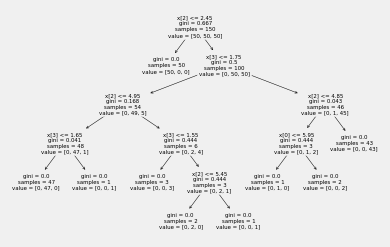

In [36]:
tree.plot_tree(clf)

In [41]:
pip install graphviz

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3.1 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


import graphviz 
dot_data = tree.export_graphviz(clf, out_file=None) 
graph = graphviz.Source(dot_data) 
graph.render("iris") 

dot_data = tree.export_graphviz(clf, out_file=None,
                                feature_names=iris.feature_names,  
                                class_names=iris.target_names,  
                                filled=True, rounded=True,  
                                special_characters=True)  
graph = graphviz.Source(dot_data)  
graph 

In [28]:
confusion_matrix(y_test, predicted)

array([[15,  0,  0],
       [ 0, 16,  0],
       [ 0,  0, 14]], dtype=int64)

7. What are ensemble methods in tree based algorithms ?

The literary meaning of word ‘ensemble’ is group. Ensemble methods involve group of predictive models to achieve a better accuracy and model stability. Ensemble methods are known to impart supreme boost to tree based models.
a tree based algorithm also suffers from the plague of bias and variance. Bias means, ‘how much on an average are the predicted values different from the actual value.’ Variance means, ‘how different will the predictions of the model be at the same point if different samples are taken from the same population’.
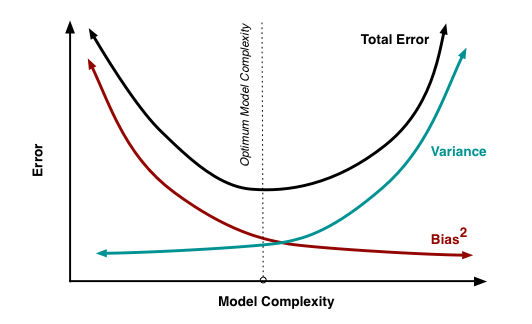

Bagging is an ensemble technique used to reduce the variance of our predictions by combining the result of multiple classifiers modeled on different sub-samples of the same data set.
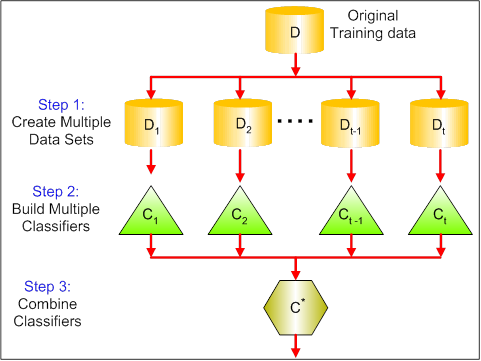

Random Forest is considered to be a panacea of all data science problems. On a funny note, when you can’t think of any algorithm (irrespective of situation), use random forest!

Random Forest is a versatile machine learning method capable of performing both regression and classification tasks. It also undertakes dimensional reduction methods, treats missing values, outlier values and other essential steps of data exploration, and does a fairly good job. It is a type of ensemble learning method, where a group of weak models combine to form a powerful model.

To classify a new object based on attributes, each tree gives a classification and we say the tree “votes” for that class. The forest chooses the classification having the most votes (over all the trees in the forest) and in case of regression, it takes the average of outputs by different trees.

When training, each tree in a random forest learns from a random sample of the data points. The samples are drawn with replacement, known as bootstrapping, The idea is that by training each tree on different samples, although each tree might have high variance with respect to a particular set of the training data, overall, the entire forest will have lower variance but not at the cost of increasing the bias.

At test time, predictions are made by averaging the predictions of each decision tree. This procedure of training each individual learner on different bootstrapped subsets of the data and then averaging the predictions is known as bagging, short for bootstrap aggregating.
Boosting
For choosing the right distribution, here are the following steps:

Step 1:  The base learner takes all the distributions and assign equal weight or attention to each observation.

Step 2: If there is any prediction error caused by first base learning algorithm, then we pay higher attention to observations having prediction error. Then, we apply the next base learning algorithm.

Step 3: Iterate Step 2 till the limit of base learning algorithm is reached or higher accuracy is achieved.

Finally, it combines the outputs from weak learner and creates  a strong learner which eventually improves the prediction power of the model. Boosting pays higher focus on examples which are mis-classiﬁed or have higher errors by preceding weak rules.
There are many boosting algorithms which impart additional boost to model’s accuracy. In this tutorial, we’ll learn about the two most commonly used algorithms i.e. Gradient Boosting (GBM) and XGboost.

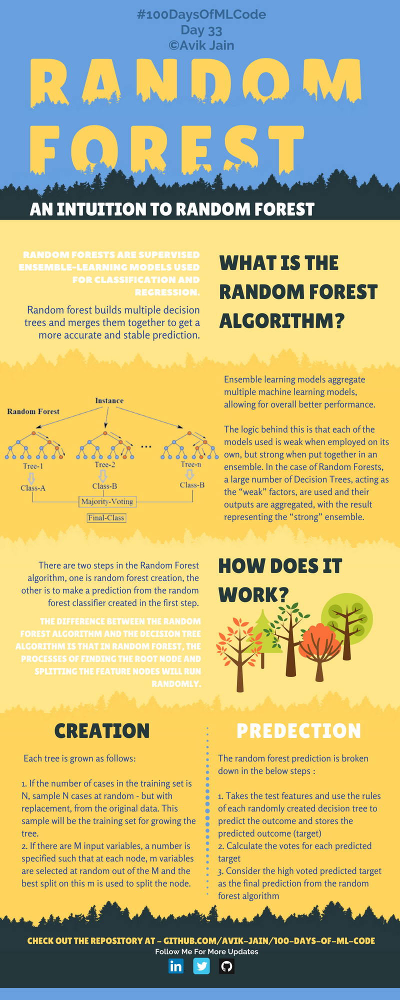

class sklearn.ensemble.RandomForestClassifier(n_estimators=100, *, criterion='gini', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='sqrt', max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, class_weight=None, ccp_alpha=0.0, max_samples=None)

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

In [2]:
df = pd.read_csv('2015.csv').sample(100000, random_state = 10)
df.head()

,_STATE,FMONTH,IDATE,IMONTH,IDAY,IYEAR,DISPCODE,SEQNO,_PSU,CTELENUM,...,_PAREC1,_PASTAE1,_LMTACT1,_LMTWRK1,_LMTSCL1,_RFSEAT2,_RFSEAT3,_FLSHOT6,_PNEUMO2,_AIDTST3
307106,39.0,11.0,b'11062015',b'11',b'06',b'2015',1100.0,2.015009e+09,2.015009e+09,1.0,...,2.0,2.0,3.0,3.0,4.0,1.0,1.0,NaN,NaN,2.0
214254,28.0,9.0,b'09142015',b'09',b'14',b'2015',1100.0,2.015005e+09,2.015005e+09,NaN,...,2.0,2.0,3.0,3.0,4.0,1.0,2.0,NaN,NaN,9.0
195573,27.0,3.0,b'03142015',b'03',b'14',b'2015',1100.0,2.015003e+09,2.015003e+09,1.0,...,1.0,1.0,3.0,3.0,4.0,1.0,1.0,NaN,NaN,2.0
380619,49.0,7.0,b'10192015',b'10',b'19',b'2015',1100.0,2.015007e+09,2.015007e+09,NaN,...,4.0,2.0,3.0,3.0,4.0,1.0,1.0,NaN,NaN,2.0
161871,24.0,1.0,b'01282015',b'01',b'28',b'2015',1100.0,2.015000e+09,2.015000e+09,1.0,...,2.0,2.0,3.0,3.0,4.0,1.0,1.0,NaN,NaN,2.0


In [3]:
df = df.select_dtypes('number')

In [4]:
df['_RFHLTH'] = df['_RFHLTH'].replace({2: 0})
df = df.loc[df['_RFHLTH'].isin([0, 1])].copy()
df = df.rename(columns = {'_RFHLTH': 'label'})
df['label'].value_counts()

1.0    81061
0.0    18636
Name: label, dtype: int64

In [5]:
# Remove columns with missing values
df = df.drop(columns = ['POORHLTH', 'PHYSHLTH', 'GENHLTH', 'PAINACT2', 
                        'QLMENTL2', 'QLSTRES2', 'QLHLTH2', 'HLTHPLN1', 'MENTHLTH'])

In [6]:
from sklearn.model_selection import train_test_split

# Extract the labels
labels = np.array(df.pop('label'))

# 30% examples in test data
train, test, train_labels, test_labels = train_test_split(df, labels, 
                                                          stratify = labels,
                                                          test_size = 0.3, 
                                                          random_state = 32)

In [7]:
np.unique(labels)

array([0., 1.])

In [8]:
train.columns.shape,train.shape

((313,), (69787, 313))

In [9]:
train = train.fillna(train.mean())
test = test.fillna(test.mean())

# Features for feature importances
features = list(train.columns)

In [10]:
from sklearn.ensemble import RandomForestClassifier

In [11]:
# Train tree
tree = RandomForestClassifier(n_estimators=30,criterion = 'gini',max_depth=10)
tree.fit(train, train_labels)

RandomForestClassifier(max_depth=10, n_estimators=30)

In [12]:
label_pred = tree.predict(test)

In [13]:
label_pred_tr = tree.predict(train)

In [15]:
from sklearn.metrics import confusion_matrix,accuracy_score
accuracy_score(train_labels,label_pred_tr)

0.884921260406666

In [16]:

print(accuracy_score(test_labels,label_pred))
print(confusion_matrix(test_labels,label_pred))

0.8616850551654965
[[ 2232  3359]
 [  778 23541]]


# Doing this hyperparameter tuning
The technique of cross validation (CV) is best explained by example using the most common method, K-Fold CV. When we approach a machine learning problem, we make sure to split our data into a training and a testing set. In K-Fold CV, we further split our training set into K number of subsets, called folds. We then iteratively fit the model K times, each time training the data on K-1 of the folds and evaluating on the Kth fold (called the validation data). As an example, consider fitting a model with K = 5. The first iteration we train on the first four folds and evaluate on the fifth. The second time we train on the first, second, third, and fifth fold and evaluate on the fourth. We repeat this procedure 3 more times, each time evaluating on a different fold. At the very end of training, we average the performance on each of the folds to come up with final validation metrics for the model.

we perform many iterations of the entire K-Fold CV process, each time using different model settings. We then compare all of the models, select the best one, train it on the full training set, and then evaluate on the testing set. This sounds like an awfully tedious process! Each time we want to assess a different set of hyperparameters, we have to split our training data into K fold and train and evaluate K times. If we have 10 sets of hyperparameters and are using 5-Fold CV, that represents 50 training loops. Fortunately, as with most problems in machine learning, someone has solved our problem and model tuning with K-Fold CV can be automatically implemented in Scikit-Learn.

https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74

In [17]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(random_state = 42)
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(rf.get_params())

Parameters currently in use:

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}


In [18]:
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 1500, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 61, num = 8 )]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,20]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1,4,20,50]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

pprint(random_grid)

{'bootstrap': [True, False],
 'max_depth': [5, 13, 21, 29, 37, 45, 53, 61, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 4, 20, 50],
 'min_samples_split': [2, 5, 10, 20],
 'n_estimators': [10, 175, 341, 506, 672, 837, 1003, 1168, 1334, 1500]}


In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier(random_state = 42)
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator=rf, param_distributions=random_grid,
                              n_iter = 100, scoring='neg_mean_absolute_error', 
                              cv = 3, verbose=2, random_state=42, n_jobs=-1,
                              return_train_score=True)

# Fit the random search model
rf_random.fit(train, train_labels);

Fitting 3 folds for each of 100 candidates, totalling 300 fits


In [ ]:
rf_random.best_params_

In [ ]:
rf_random.cv_results_

In [ ]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    errors = abs(predictions - test_labels)
    mape = 100 * np.mean(errors / test_labels)
    accuracy = 100 - mape
    print('Model Performance')
    print('Average Error: {:0.4f} degrees.'.format(np.mean(errors)))
    print('Accuracy = {:0.2f}%.'.format(accuracy))
    
    return accuracy

In [ ]:
base_model = RandomForestRegressor(n_estimators = 10, random_state = 42)
base_model.fit(train_features, train_labels)
base_accuracy = evaluate(base_model, test_features, test_labels)

In [ ]:
best_random = rf_random.best_estimator_
random_accuracy = evaluate(best_random, test_features, test_labels)

In [ ]:
print('Improvement of {:0.2f}%.'.format( 100 * (random_accuracy - base_accuracy) / base_accuracy))


follow this github link for hyperparameter tuning complete idea
https://github.com/WillKoehrsen/Machine-Learning-Projects/blob/master/random_forest_explained/Improving%20Random%20Forest%20Part%201.ipynb

The term ‘Boosting’ refers to a family of algorithms which converts weak learner to strong learners
To find weak rule, we apply base learning (ML) algorithms with a different distribution. Each time base learning algorithm is applied, it generates a new weak prediction rule. This is an iterative process. After many iterations, the boosting algorithm combines these weak rules into a single strong prediction rule. This is how the ensemble model is built.

Here’s another question which might haunt you, ‘How do we choose different distribution for each round?’

For choosing the right distribution, here are the following steps:

Step 1:  The base learner takes all the distributions and assign equal weight or attention to each observation.

Step 2: If there is any prediction error caused by first base learning algorithm, then we pay higher attention to observations having prediction error. Then, we apply the next base learning algorithm.

Step 3: Iterate Step 2 till the limit of base learning algorithm is reached or higher accuracy is achieved.

Finally, it combines the outputs from weak learner and creates  a strong learner which eventually improves the prediction power of the model.

many advantages of Xgboost over GBM:

Regularization:
Standard GBM implementation has no regularization like XGBoost, therefore it also helps to reduce overfitting.
In fact, XGBoost is also known as ‘regularized boosting‘ technique.
Parallel Processing:
XGBoost implements parallel processing and is blazingly faster as compared to GBM.
But hang on, we know that boosting is sequential process so how can it be parallelized? We know that each tree can be built only after the previous one, so what stops us from making a tree using all cores? I hope you get where I’m coming from. Check this link out to explore further.
XGBoost also supports implementation on Hadoop.
High Flexibility
XGBoost allow users to define custom optimization objectives and evaluation criteria.
This adds a whole new dimension to the model and there is no limit to what we can do.
Handling Missing Values
XGBoost has an in-built routine to handle missing values.
User is required to supply a different value than other observations and pass that as a parameter. XGBoost tries different things as it encounters a missing value on each node and learns which path to take for missing values in future.
Tree Pruning:
A GBM would stop splitting a node when it encounters a negative loss in the split. Thus it is more of a greedy algorithm.
XGBoost on the other hand make splits upto the max_depth specified and then start pruning the tree backwards and remove splits beyond which there is no positive gain.
Another advantage is that sometimes a split of negative loss say -2 may be followed by a split of positive loss +10. GBM would stop as it encounters -2. But XGBoost will go deeper and it will see a combined effect of +8 of the split and keep both.
Built-in Cross-Validation
XGBoost allows user to run a cross-validation at each iteration of the boosting process and thus it is easy to get the exact optimum number of boosting iterations in a single run.
This is unlike GBM where we have to run a grid-search and only a limited values can be tested.
Continue on Existing Model
User can start training an XGBoost model from its last iteration of previous run. This can be of significant advantage in certain specific applications.
GBM implementation of sklearn also has this feature so they are even on this point.
The following are the three main types of boosting:

Adaptive boosting
Adaptive Boosting (AdaBoost) was one of the earliest boosting models developed. It adapts and tries to self-correct in every iteration of the boosting process. 

AdaBoost initially gives the same weight to each dataset. Then, it automatically adjusts the weights of the data points after every decision tree. It gives more weight to incorrectly classified items to correct them for the next round. It repeats the process until the residual error, or the difference between actual and predicted values, falls below an acceptable threshold.
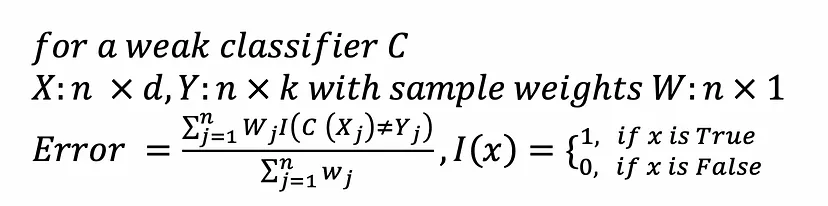
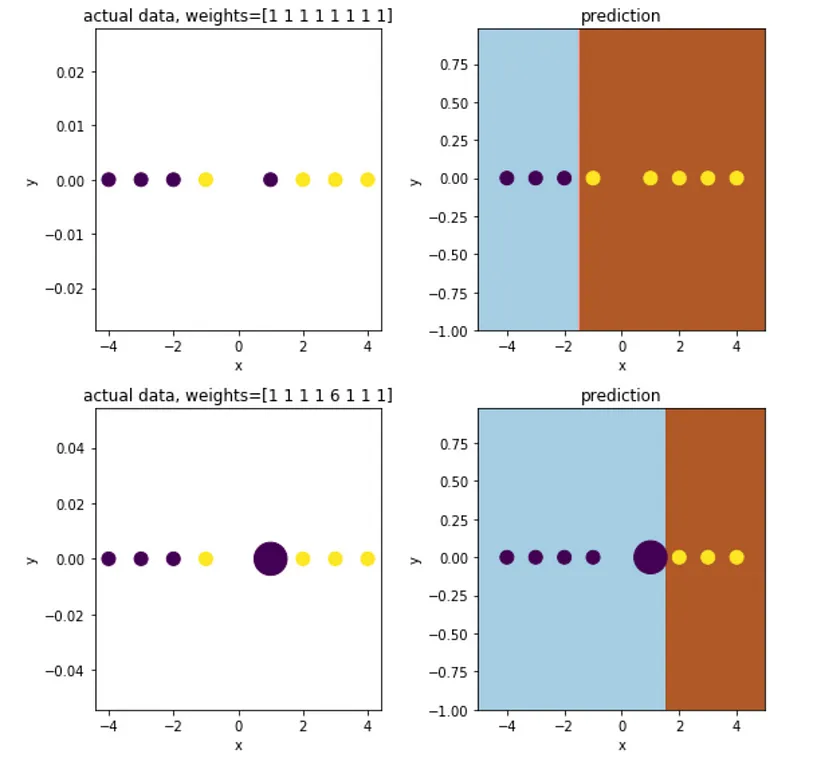
You can use AdaBoost with many predictors, and it is typically not as sensitive as other boosting algorithms. This approach does not work well when there is a correlation among features or high data dimensionality. Overall, AdaBoost is a suitable type of boosting for classification problems.

Gradient boosting
Gradient Boosting (GB) is similar to AdaBoost in that it, too, is a sequential training technique. The difference between AdaBoost and GB is that GB does not give incorrectly classified items more weight. Instead, GB software optimizes the loss function by generating base learners sequentially so that the present base learner is always more effective than the previous one. This method attempts to generate accurate results initially instead of correcting errors throughout the process, like AdaBoost. For this reason, GB software can lead to more accurate results. Gradient Boosting can help with both classification and regression-based problems.

Extreme gradient boosting
Extreme Gradient Boosting (XGBoost) improves gradient boosting for computational speed and scale in several ways. XGBoost uses multiple cores on the CPU so that learning can occur in parallel during training. It is a boosting algorithm that can handle extensive datasets, making it attractive for big data applications. The key features of XGBoost are parallelization, distributed computing, cache optimization, and out-of-core processing.
https://towardsdatascience.com/boosting-algorithms-explained-d38f56ef3f30

In [13]:
help(AdaBoostClassifier)

Help on class AdaBoostClassifier in module sklearn.ensemble._weight_boosting:

class AdaBoostClassifier(sklearn.base.ClassifierMixin, BaseWeightBoosting)
 |  AdaBoostClassifier(estimator=None, *, n_estimators=50, learning_rate=1.0, algorithm='SAMME.R', random_state=None, base_estimator='deprecated')
 |  
 |  An AdaBoost classifier.
 |  
 |  An AdaBoost [1] classifier is a meta-estimator that begins by fitting a
 |  classifier on the original dataset and then fits additional copies of the
 |  classifier on the same dataset but where the weights of incorrectly
 |  classified instances are adjusted such that subsequent classifiers focus
 |  more on difficult cases.
 |  
 |  This class implements the algorithm known as AdaBoost-SAMME [2].
 |  
 |  Read more in the :ref:`User Guide <adaboost>`.
 |  
 |  .. versionadded:: 0.14
 |  
 |  Parameters
 |  ----------
 |  estimator : object, default=None
 |      The base estimator from which the boosted ensemble is built.
 |      Support for sample

In [17]:
from sklearn.ensemble import AdaBoostClassifier
#from sklearn.datasets import make_classification
#X,Y = make_classification(n_samples=100, n_features=2, n_informative=2,
           #               n_redundant=0, n_repeated=0, random_state=102)
clf = AdaBoostClassifier(n_estimators=50, random_state=8, algorithm='SAMME.R')
clf.fit(train, train_labels)
y_pred = clf.predict(test)

In [18]:
from sklearn.metrics import accuracy_score
test_pred = clf.predict(train)
accuracy_score(train_labels,test_pred)

0.8670526029203147

In [19]:
accuracy_score(test_labels,y_pred)

0.8659311267134737

2. Gradient Boosting
Gradient boosting approaches the problem a bit differently. Instead of adjusting weights of data points, Gradient boosting focuses on the difference between the prediction and the ground truth.
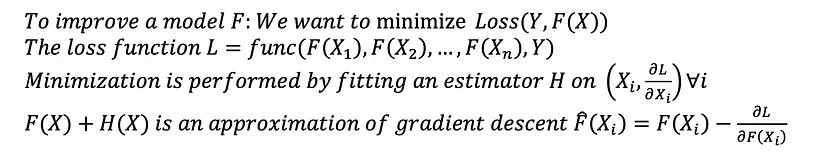
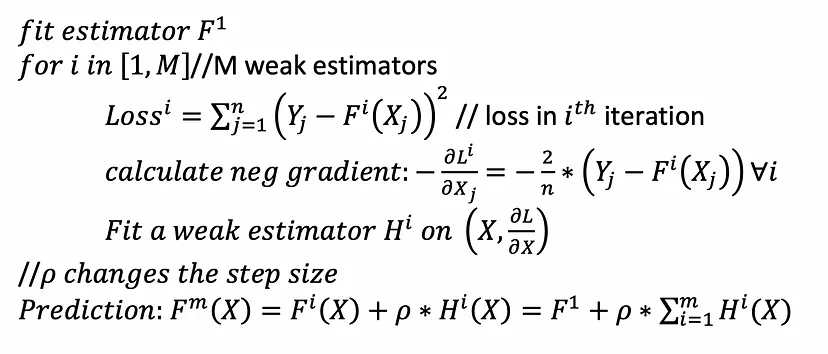

In [21]:
from sklearn.ensemble import GradientBoostingClassifier
help(GradientBoostingClassifier)

Help on class GradientBoostingClassifier in module sklearn.ensemble._gb:

class GradientBoostingClassifier(sklearn.base.ClassifierMixin, BaseGradientBoosting)
 |  GradientBoostingClassifier(*, loss='log_loss', learning_rate=0.1, n_estimators=100, subsample=1.0, criterion='friedman_mse', min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_depth=3, min_impurity_decrease=0.0, init=None, random_state=None, max_features=None, verbose=0, max_leaf_nodes=None, warm_start=False, validation_fraction=0.1, n_iter_no_change=None, tol=0.0001, ccp_alpha=0.0)
 |  
 |  Gradient Boosting for classification.
 |  
 |  This algorithm builds an additive model in a forward stage-wise fashion; it
 |  allows for the optimization of arbitrary differentiable loss functions. In
 |  each stage ``n_classes_`` regression trees are fit on the negative gradient
 |  of the loss function, e.g. binary or multiclass log loss. Binary
 |  classification is a special case where only a single regression

In [22]:

model = GradientBoostingClassifier(loss = 'log_loss', n_estimators=100, min_samples_split = 10,
                                   verbose = 1)
model.fit(train,train_labels)

      Iter       Train Loss   Remaining Time 
         1           0.9124            1.59m
         2           0.8761            1.56m
         3           0.8478            1.56m
         4           0.8249            1.53m
         5           0.8061            1.50m
         6           0.7888            1.48m
         7           0.7752            1.46m
         8           0.7622            1.44m
         9           0.7523            1.43m
        10           0.7418            1.41m
        20           0.6835            1.26m
        30           0.6551            1.13m
        40           0.6393           57.78s
        50           0.6292           48.05s
        60           0.6225           38.43s
        70           0.6173           28.80s
        80           0.6131           19.22s
        90           0.6098            9.57s
       100           0.6069            0.00s


GradientBoostingClassifier(min_samples_split=10, verbose=1)

In [25]:
test_pred = model.predict(train)
accuracy_score(train_labels,test_pred)

0.8720965222749223

In [26]:
accuracy_score(test_labels,y_pred)

0.8659311267134737

# XGBoost
XGBoost (eXtreme Gradient Boosting) is an advanced implementation of a gradient boosting algorithm.
Parallel Processing
XGBoost implements parallel processing and is blazingly faster as compared to GBM.

But hang on, we know that boosting is a sequential process so how can it be parallelized? We know that each tree can be built only after the previous one, so what stops us from making a tree using all cores? I hope you get where I’m coming from. Check this link out to explore further. XGBoost also supports implementation on Hadoop.

High Flexibility
XGBoost allows users to define custom optimization objectives and evaluation criteria.
Handling Missing Values
XGBoost has an in-built routine to handle missing values. The user is required to supply a different value than other observations and pass that as a parameter.

Tree Pruning
A GBM would stop splitting a node when it encounters a negative loss in the split. Thus it is more of a greedy algorithm. XGBoost, on the other hand, makes splits up to the max_depth specified and then starts pruning the tree backward and removing splits beyond which there is no positive gain.
Another advantage is that sometimes a split of negative loss, say -2, may be followed by a split of positive loss +10. GBM would stop as it encounters -2. But XGBoost will go deeper, and it will see a combined effect of +8 of the split and keep both.

Built-in Cross-Validation
XGBoost allows the user to run a cross-validation at each iteration of the boosting process and thus, it is easy to get the exact optimum number of boosting iterations in a single run. This is unlike GBM, where we have to run a grid search, and only limited values can be tested.

Continue on the Existing Model
Users can start training an XGBoost model from its last iteration of the previous run. This can be of significant advantage in certain specific applications. GBM implementation of sklearn also has this feature, so they are even on this point.

I hope now you understand the sheer power XGBoost algorithm. Note that these are the points that I could muster. Do you know a few more? Feel free to drop a comment below, and I will update the list.
https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/?utm_source=reading_list&utm_medium=https://www.analyticsvidhya.com/blog/2015/11/quick-introduction-boosting-algorithms-machine-learning/

In [31]:
import xgboost as xgb
help(xgb.XGBClassifier)

Help on class XGBClassifier in module xgboost.sklearn:

class XGBClassifier(XGBModel, sklearn.base.ClassifierMixin)
 |  XGBClassifier(*, objective: Union[str, Callable[[numpy.ndarray, numpy.ndarray], Tuple[numpy.ndarray, numpy.ndarray]], NoneType] = 'binary:logistic', use_label_encoder: Optional[bool] = None, **kwargs: Any) -> None
 |  
 |  Implementation of the scikit-learn API for XGBoost classification.
 |  
 |  
 |  Parameters
 |  ----------
 |  
 |      n_estimators : int
 |          Number of boosting rounds.
 |  
 |      max_depth :  Optional[int]
 |          Maximum tree depth for base learners.
 |      max_leaves :
 |          Maximum number of leaves; 0 indicates no limit.
 |      max_bin :
 |          If using histogram-based algorithm, maximum number of bins per feature
 |      grow_policy :
 |          Tree growing policy. 0: favor splitting at nodes closest to the node, i.e. grow
 |          depth-wise. 1: favor splitting at nodes with highest loss change.
 |      learnin

In [33]:
# define data_dmatrix
data_dmatrix = xgb.DMatrix(data=train,label=train_labels)
data_dmatrix_test = xgb.DMatrix(data = test, label = test_labels)

In [39]:
params = {
            'objective':'binary:logistic',
            'max_depth': 8,
            'alpha': 10,
            'learning_rate': 1.0,
            'n_estimators':150
        }
xgb_clf = xgb.XGBClassifier(**params)

xgb_clf.fit(train,train_labels)

XGBClassifier(alpha=10, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=1.0, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=150, n_jobs=None, num_parallel_tree=None,
              predictor=None, ...)

In [40]:
# make predictions on test data
y_pred = xgb_clf.predict(test)

In [41]:
# check accuracy score
from sklearn.metrics import accuracy_score
print(accuracy_score(test_labels, y_pred))

0.8450685389501839


To build more robust models with XGBoost, we must do k-fold cross validation. In this way, we ensure that the original training dataset is used for both training and validation. Also, each entry is used for validation just once. XGBoost supports k-fold cross validation using the cv() method. In this method, we will specify several parameters which are as follows:-

nfolds - This parameter specifies the number of cross-validation sets we want to build.

num_boost_round - It denotes the number of trees we build.

metrics - It is the performance evaluation metrics to be considered during CV.

as_pandas - It is used to return the results in a pandas DataFrame.

early_stopping_rounds - This parameter stops training of the model early if the hold-out metric does not improve for a given number of rounds.

seed - This parameter is used for reproducibility of results.

We can use these parameters to build a k-fold cross-validation model by calling XGBoost's CV() method.

In [42]:
from xgboost import cv

params = {"objective":"binary:logistic",'colsample_bytree': 0.3,'learning_rate': 0.1,
                'max_depth': 5, 'alpha': 10}

xgb_cv = cv(dtrain=data_dmatrix, params=params, nfold=3,
                    num_boost_round=50, early_stopping_rounds=10, metrics="auc", as_pandas=True, seed=123)

In [43]:
xgb_cv.head()

,train-auc-mean,train-auc-std,test-auc-mean,test-auc-std
0,0.819978,0.000881,0.817022,0.001202
1,0.847959,0.004772,0.843442,0.003315
2,0.859490,0.004202,0.854144,0.001410
3,0.862686,0.004511,0.858222,0.001235
4,0.867486,0.003715,0.862974,0.000869


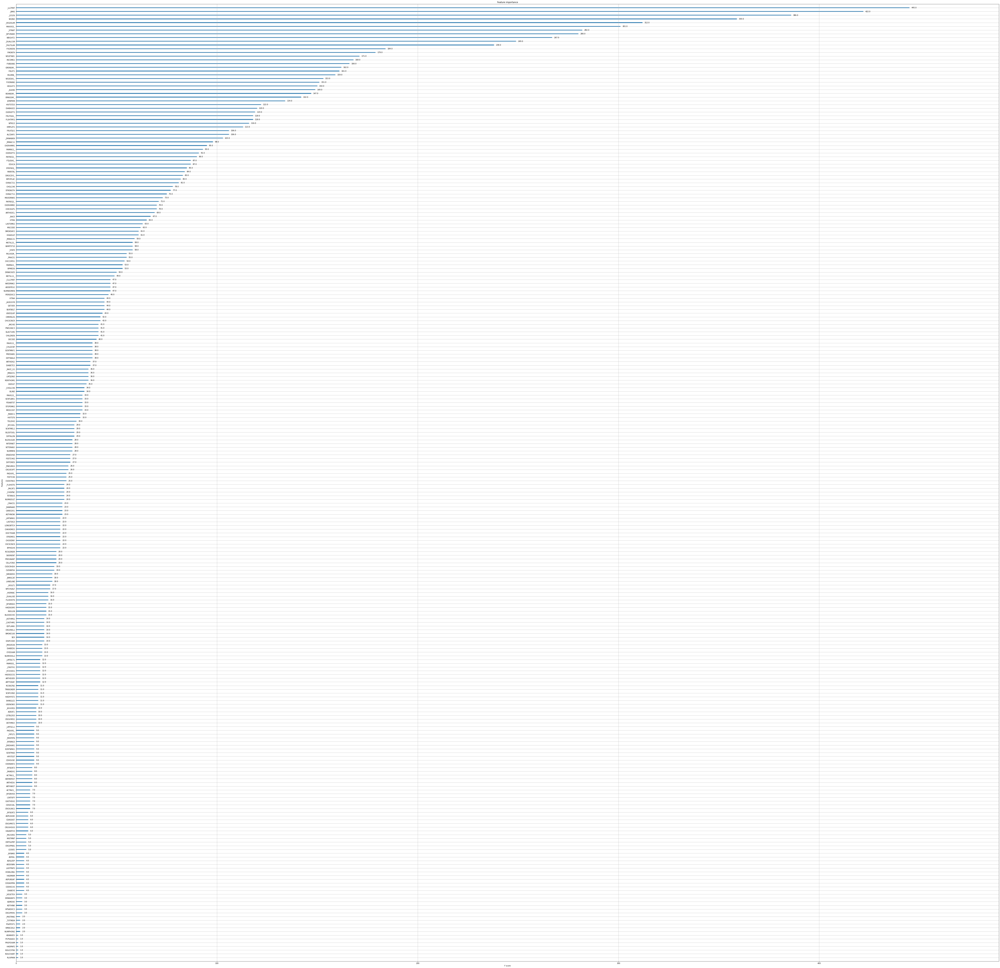

In [49]:
xgb.plot_importance(xgb_clf)
plt.rcParams['figure.figsize'] = [100, 100]
plt.show()

# CatBoost

In [53]:
from catboost import CatBoostClassifier

In [57]:
help(CatBoostClassifier)

Help on class CatBoostClassifier in module catboost.core:

class CatBoostClassifier(CatBoost)
 |  CatBoostClassifier(iterations=None, learning_rate=None, depth=None, l2_leaf_reg=None, model_size_reg=None, rsm=None, loss_function=None, border_count=None, feature_border_type=None, per_float_feature_quantization=None, input_borders=None, output_borders=None, fold_permutation_block=None, od_pval=None, od_wait=None, od_type=None, nan_mode=None, counter_calc_method=None, leaf_estimation_iterations=None, leaf_estimation_method=None, thread_count=None, random_seed=None, use_best_model=None, best_model_min_trees=None, verbose=None, silent=None, logging_level=None, metric_period=None, ctr_leaf_count_limit=None, store_all_simple_ctr=None, max_ctr_complexity=None, has_time=None, allow_const_label=None, target_border=None, classes_count=None, class_weights=None, auto_class_weights=None, class_names=None, one_hot_max_size=None, random_strength=None, name=None, ignored_features=None, train_dir=None, 

In [58]:
categorical_features_indices = np.where(train.dtypes != np.float)[0]

C:\Users\Win10\AppData\Local\Temp\ipykernel_1168\2226890291.py:1: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  categorical_features_indices = np.where(train.dtypes != np.float)[0]


In [78]:
model=CatBoostClassifier(iterations=84, depth=10, learning_rate=0.1, loss_function='Logloss')
model.fit(train, train_labels,cat_features=categorical_features_indices,eval_set=(test, test_labels),plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6095455	test: 0.6108677	best: 0.6108677 (0)	total: 254ms	remaining: 21.1s
1:	learn: 0.5427554	test: 0.5451105	best: 0.5451105 (1)	total: 516ms	remaining: 21.1s
2:	learn: 0.4937642	test: 0.4968684	best: 0.4968684 (2)	total: 804ms	remaining: 21.7s
3:	learn: 0.4570693	test: 0.4607180	best: 0.4607180 (3)	total: 1.06s	remaining: 21.3s
4:	learn: 0.4254057	test: 0.4303188	best: 0.4303188 (4)	total: 1.34s	remaining: 21.2s
5:	learn: 0.4007182	test: 0.4067304	best: 0.4067304 (5)	total: 1.61s	remaining: 21s
6:	learn: 0.3820708	test: 0.3887632	best: 0.3887632 (6)	total: 1.88s	remaining: 20.7s
7:	learn: 0.3669987	test: 0.3747758	best: 0.3747758 (7)	total: 2.17s	remaining: 20.6s
8:	learn: 0.3549808	test: 0.3638732	best: 0.3638732 (8)	total: 2.48s	remaining: 20.6s
9:	learn: 0.3465322	test: 0.3559792	best: 0.3559792 (9)	total: 2.78s	remaining: 20.6s
10:	learn: 0.3385064	test: 0.3488270	best: 0.3488270 (10)	total: 3.06s	remaining: 20.3s
11:	learn: 0.3323404	test: 0.3431699	best: 0.3431699 (

In [79]:
train_pred = model.predict(train)
accuracy_score(train_labels,train_pred)

0.9015289380543654

In [80]:
test_pred = model.predict(test)
accuracy_score(test_labels,test_pred)

0.8685389501838849

# Time series 
Stock Price Prediction And Forecasting Using Stacked LSTM- 